# GradCam generation for HPA paper

The best submission is based on ensemble of several models. We've selected our best single full image model (Puzzle-CAM) to generate GradCam images.

Cell masks detection removed as not really needed for our purpose (this model intersects CAM with cell mask for final prediction).

- Best submission kernel: https://www.kaggle.com/mpware/hpa-ensemble-v4-9
- Ensemble prediction kernel on new provided images: https://www.kaggle.com/mpware/hpa-ensemble-v4-9-paper
- GradCam implementation: https://github.com/jacobgil/pytorch-grad-cam

In [1]:
!pip install grad-cam
!pip install ttach
!pip install timm

     |████████████████████████████████| 1.7 MB 600 kB/s 
  Installing build dependencies ... - \ | / - done
  Getting requirements to build wheel ... - done
    Preparing wheel metadata ... - done
  Created wheel for grad-cam: filename=grad_cam-1.3.1-py3-none-any.whl size=16430 sha256=811828e8421aef6187e03a9b1ecb76a72a38060355fcc52619ffb0ee4b1dd880
  Stored in directory: /root/.cache/pip/wheels/65/76/4d/d100c6bea1977cafe1d8de42df7fd8becdcd9daa999be1fac8
Successfully built grad-cam
     |████████████████████████████████| 376 kB 597 kB/s 


In [2]:
import os, sys, random, gc, math, glob
import numpy as np
import pandas as pd
import operator
import h5py
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import functools
import timm
from PIL import Image
import skimage.io
import skimage.transform
import matplotlib.pyplot as plt
import albumentations as A
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', 200)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 4000)

In [3]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

In [4]:
HOME =  "./"
TEST_HOME = "../input/hpa-paper/CAM_images/"

ON_FLY_MASK = True
FAST_INSTANCES = True
KEEP_ORIGINAL_IMAGE = True
RESIZE_ORIGINAL_IMAGE = None

# 19 class labels.
class_mapping = {
    0: 'Nucleoplasm', 1: 'Nuclear membrane', 2: 'Nucleoli', 3: 'Nucleoli fibrillar center',
    4: 'Nuclear speckles', 5: 'Nuclear bodies', 6: 'Endoplasmic reticulum', 7: 'Golgi apparatus', 8: 'Intermediate filaments',
    9: 'Actin filaments', 10: 'Microtubules', 11: 'Mitotic spindle', 12: 'Centrosome', 13: 'Plasma membrane', 14: 'Mitochondria',
    15: 'Aggresome', 16: 'Cytosol', 17: 'Vesicles and punctate cytosolic patterns', 18: 'Negative',
}

In [5]:
# Use PIL to support 16 bits, normalize=True to return [0-1.0] float32 image
def read_image(filename, compose=None, normalize=False, norm_value=65535.0, images_root=TEST_HOME):
    filename = images_root + filename
    filename = filename + "_red.png" if "_red.png" not in filename else filename
    mt_, pi_, nu_, er_ = filename, filename.replace('_red', '_green'), filename.replace('_red', '_blue'), filename.replace('_red', '_yellow')
    if compose is None:
        mt = np.asarray(Image.open(mt_)).astype(np.uint16)
        pi = np.asarray(Image.open(pi_)).astype(np.uint16)
        nu = np.asarray(Image.open(nu_)).astype(np.uint16)  
        er = np.asarray(Image.open(er_)).astype(np.uint16)
        ret = np.dstack((mt, pi, nu, er))
    else:
        if compose == "RGB": 
            mt = np.asarray(Image.open(mt_)).astype(np.uint16)
            pi = np.asarray(Image.open(pi_)).astype(np.uint16)
            nu = np.asarray(Image.open(nu_)).astype(np.uint16)
            ret = np.dstack((mt, pi, nu))        
        elif compose == "RYB":
            mt = np.asarray(Image.open(mt_)).astype(np.uint16)
            er = np.asarray(Image.open(er_)).astype(np.uint16)
            nu = np.asarray(Image.open(nu_)).astype(np.uint16)
            ret = np.dstack((mt, er, nu))
        elif compose == "RYGYB":
            mt = np.asarray(Image.open(mt_))
            pi = np.asarray(Image.open(pi_))
            nu = np.asarray(Image.open(nu_))
            er = np.asarray(Image.open(er_))
            ret = np.dstack(((mt + er)/2.0, (pi + er/2)/1.5, nu))
        else:
            raise Exception("Unknown compose:", compose)
    
    if normalize is True:
        # Inference: Some images are np.uint16 but from 0-255 range! "020a29cf-2c24-478b-8603-c22a90dc3e31"
        if ret.max() > 255:
            ret = (ret/norm_value).astype(np.float32)
        else:
            ret = (ret/255).astype(np.float32)
            
    # Inference: 1728 not compatible with HPA segmentation
    if ON_FLY_MASK is False:
        if ret.shape[0] == 1728:
            ret = skimage.transform.resize(ret, (2048, 2048), anti_aliasing=True)
    
    return ret

In [6]:
COMPOSE = None
IMAGE_SIZE = 512
SEG_SCALE_FACTOR = 0.25

class raw_conf:

    def __init__(self):
        super().__init__()
        
        self.inference = True

        # Factory
        self.factory = None
        self.compose = COMPOSE
        self.normalize = True
        self.norm_value = 65535.0 # Images are np.uint16
        
        # Dataset
        self.image_size = IMAGE_SIZE # Need to resize
        self.seg_scale_factor = SEG_SCALE_FACTOR
        self.denormalize = 255 # Move back normalized image to 0-255 uint8 for Albumentations
        self.dilate_mask = None
        
        # Dataloader        
        
        # Model
        self.mtype = "siamese" # "regular"
        self.backbone = 'regnety_064'
        self.pretrained_weights = "imagenet"
        self.INPUT_RANGE = [0, 1]
        self.IMG_MEAN = [0.485, 0.456, 0.406, 0.485] if self.compose is None else [0.485, 0.456, 0.406]
        self.IMG_STD = [0.229, 0.224, 0.225, 0.229] if self.compose is None else [0.229, 0.224, 0.225]
        self.num_classes = 19
        self.with_cam = True # False
        self.puzzle_pieces = 4 # Only for Siamese
        self.hpa_classifier_weights = None
        self.dropout = None
        
        # Model output
        self.post_activation = "sigmoid"
        self.output_key = "logits" if self.mtype == "regular" else "single_logits" # None
        self.output_key_extra = "features" if self.mtype == "regular" else "single_features" # None      
        self.output_key_siamese = None if self.mtype == "regular" else "tiled_logits"
        self.output_key_extra_siamese = None if self.mtype == "regular" else "tiled_features"      
        
        # Loss
        self.alpha = 1.0 # Single image classification loss
        self.beta =  0.0 if self.mtype == "regular" else 1.0 # Reconstructed image classification loss
        self.gamma = 0.0 if self.mtype == "regular" else 1.0 # Reconstruction distance loss
        self.delta = 0.0 # Tiled image loss
        self.loss = None  
        
        self.sampler = None
        self.sampler_cap = None # 0.002 # None 95th percentile of train average prob
        
        self.fp16 = True
        self.finetune = False
        
        self.optimizer = "Adam"
        self.scheduler = None if self.finetune is True or self.optimizer != "Adam" else "Cosine"
        
        self.lr = 0.001 if self.finetune is False else 0.00005
        self.min_lr = 0.0001 if self.finetune is False else 0.00001
        self.beta1 = 0.9
        self.train_verbose = True # False
        self.valid_verbose = True # False
        self.full_train = False # False
        self.full_train_save = None # [16,17,18] # None

        # Train parameters
        self.L_DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') # "cpu"
        self.map_location = self.L_DEVICE
        self.WORKERS = 0 # 0
        self.BATCH_SIZE = 1 # 8 # 16 if self.mtype == "siamese" else 32
        self.ITERATIONS_LOGS = 30
        self.CYCLES = 1
        self.EPOCHS_PER_CYCLE = 32
        self.EPOCHS = self.CYCLES * self.EPOCHS_PER_CYCLE
        self.WARMUP = 0

        self.FOLDS = 4 if self.full_train is False else 0
        self.METRIC_ = "max"

        self.pin_memory = True

In [7]:
conf_siamese_seresnext50_512_384 = raw_conf()
conf_siamese_seresnext50_512_384.mtype = "siamese"
conf_siamese_seresnext50_512_384.backbone = 'seresnext50_32x4d'
conf_siamese_seresnext50_512_384.image_size = 512

conf = conf_siamese_seresnext50_512_384

In [8]:
# Mandatory transform to feed model
def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def preprocess_input(x, mean=None, std=None, input_space="RGB", input_range=None, **kwargs):

    if input_space == "BGR":
        x = x[..., ::-1].copy()

    if input_range is not None:
        if x.max() > 1 and input_range[1] == 1:
            x = x / 255.0

    if mean is not None:
        mean = np.array(mean)
        x = x - mean

    if std is not None:
        std = np.array(std)
        x = x / std

    return x

def denormalize_input(x, mean=None, std=None, input_space="RGB", input_range=None, **kwargs):

    if input_space == "BGR":
        x = x[..., ::-1].copy()

    if std is not None:
        std = np.array(std)
        x = x * std
        
    if mean is not None:
        mean = np.array(mean)
        x = x + mean
        
    if input_range is not None:
        if input_range[1] == 1:
            x = x * 255.0
    
    return x


def get_denormalize_fn(cfg):
    params = {"mean": cfg.IMG_MEAN, "std": cfg.IMG_STD, "input_range": cfg.INPUT_RANGE}
    return functools.partial(denormalize_input, **params)

def get_preprocessing_fn(cfg):
    params = {"mean": cfg.IMG_MEAN, "std": cfg.IMG_STD, "input_range": cfg.INPUT_RANGE} if ON_FLY_MASK is False else {"mean": None, "std": None, "input_range": cfg.INPUT_RANGE}
    return functools.partial(preprocess_input, **params)

def get_preprocessing(preprocessing_fn):
    return A.Compose([
        A.Lambda(image=preprocessing_fn, name="pre"),            # Convert uint8 (0-255) in range [0-1.0] and apply Apply Z-Norm that depends on each model,
        A.Lambda(image=to_tensor, name="tens"),                   # Convert (H, W, C) to (C, H, W)
        # A.Lambda(image=to_tensor, mask=to_tensor), # Convert (H, W, C) to (C, H, W) and mask to (CLASSES, H, W)
    ])

In [9]:
def get_4channels_conv(stem_conv2d):
    stem_conv2d_pretrained_weight = stem_conv2d.weight.clone()
    stem_conv2d_ = nn.Conv2d(4, 
                             stem_conv2d.out_channels, kernel_size=stem_conv2d.kernel_size, stride=stem_conv2d.stride, padding=stem_conv2d.padding, padding_mode=stem_conv2d.padding_mode, dilation=stem_conv2d.dilation, 
                             bias=True if stem_conv2d.bias is True else False)            
    stem_conv2d_.weight = nn.Parameter(torch.cat([stem_conv2d_pretrained_weight, nn.Parameter(torch.mean(stem_conv2d_pretrained_weight, axis=1).unsqueeze(1))], axis=1))  
    return stem_conv2d_


class HPAModel(nn.Module):
    def __init__(self, cfg, pretrained_weights=False):
        super().__init__()
        self.num_classes = cfg.num_classes
        self.backbone = cfg.backbone
        self.with_cam = cfg.with_cam
        self.drop_rate = cfg.dropout
        
        self.preprocess_input_fn = get_preprocessing_fn(cfg) 
                
        # Unpooled/NoClassifier (features only)
        self.mfeatures = timm.create_model(self.backbone, pretrained=False, num_classes=0, global_pool='')
        
        # Add one channel more
        if cfg.compose is None:
            if "regnet" in self.backbone:
                self.mfeatures.stem.conv = get_4channels_conv(self.mfeatures.stem.conv)
            elif "csp" in self.backbone:
                self.mfeatures.stem[0].conv = get_4channels_conv(self.mfeatures.stem[0].conv)                
            elif "resnest" in self.backbone:
                self.mfeatures.conv1[0] = get_4channels_conv(self.mfeatures.conv1[0])
            elif "seresnext" in self.backbone:
                self.mfeatures.conv1 = get_4channels_conv(self.mfeatures.conv1)                
            elif "densenet" in self.backbone:
                self.mfeatures.features.conv0 = get_4channels_conv(self.mfeatures.features.conv0) 
        
        # Classifier
        num_chs = self.mfeatures.feature_info[-1]['num_chs'] # 1296 # 2048
        self.mclassifier = nn.Conv2d(num_chs, self.num_classes, 1, bias=False)
        # self.mclassifier = timm.models.layers.linear.Linear(num_chs, self.num_classes, bias=True)
        
        # Initialize weights
        self.initialize([self.mclassifier])
        
        print("Model %s, last channels: %d, classes: %d" % (cfg.backbone, num_chs, self.num_classes))
    
    # Pooling
    def adaptive_avgmax_pool2d(self, x, output_size=1):
        x_avg = F.adaptive_avg_pool2d(x, output_size)
        x_max = F.adaptive_max_pool2d(x, output_size)
        return 0.5 * (x_avg + x_max)

    # Average pooling 2d
    def global_average_pooling_2d(self, x, keepdims=False):
        x = torch.mean(x.view(x.size(0), x.size(1), -1), -1)
        if keepdims:
            x = x.view(x.size(0), x.size(1), 1, 1)
        return x
    
    def gap(self, x, keepdims=False):
        return self.global_average_pooling_2d(x, keepdims=keepdims)
    
    def initialize(self, modules):
        for m in modules:
            if isinstance(m, nn.Conv2d):
                torch.nn.init.kaiming_normal_(m.weight)
                
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()       
    
    def forward(self, x):
        # ([BS, C, H, W])
        x = self.mfeatures(x) # (BS, num_chs, 8, 8)
        
        features = None
        if self.with_cam is True:
            if self.drop_rate is not None and self.drop_rate > 0.0:
                x = F.dropout(x, p=float(self.drop_rate), training=self.training)            
            features = self.mclassifier(x) # (BS, CLASSES, 8, 8)
            logits = self.gap(features) # (BS, CLASSES)            
        else:            
            x = self.gap(x, keepdims=True) # (BS, num_chs, 1, 1)
            if self.drop_rate is not None and self.drop_rate > 0.0:
                x = F.dropout(x, p=float(self.drop_rate), training=self.training)
            logits = self.mclassifier(x).view(-1, self.num_classes) # (BS, CLASSES)            
        
        return {"logits": logits, "features": features} # (BS, CLASSES), (BS, CLASSES, 8, 8)


class HPASiameseModel(nn.Module):
    def __init__(self, cfg, pretrained_weights=False):
        super().__init__()
        self.num_classes = cfg.num_classes
        self.backbone = cfg.backbone
        self.with_cam = cfg.with_cam
        self.puzzle_pieces = cfg.puzzle_pieces
        self.preprocess_input_fn = get_preprocessing_fn(cfg) 
        self.cnn1 = HPAModel(cfg)
        self.discard_tiles = cfg.inference
        
        if cfg.hpa_classifier_weights is not None:
            if os.path.exists(cfg.hpa_classifier_weights):
                print("Load regular HPA weights from: %s" % cfg.hpa_classifier_weights)
                self.cnn1.load_state_dict(torch.load(cfg.hpa_classifier_weights, map_location=cfg.map_location))            
        
        print("Model %s" % (cfg.mtype))
         

    def forward_once(self, x):
        x = self.cnn1(x)
        return x # {"logits": logits, "features": features}
    
    
    def forward(self, x):
        # ([BS, C, H, W])
        bs, _, _, _ = x.shape
        
        # Full image
        x1 = self.forward_once(x)
        single_logits, single_features = x1["logits"], x1["features"]
        
        # Tiled image
        if self.discard_tiles is True:
            return single_logits
            # return {
            #     "single_logits": single_logits, "single_features": single_features,
            # }    
        else:
            tiled_x = tile_features(x, self.puzzle_pieces) # (BS*puzzle_pieces, C, H//puzzle_pieces, W//puzzle_pieces) # 2x memory
            x2 = self.forward_once(tiled_x) # Shared weights
            tiled_logits, tiled_features = x2["logits"], x2["features"]        
            tiled_features = merge_features(tiled_features, self.puzzle_pieces, bs) # (BS, CLASSES, 8, 8)
            tiled_logits_reconstructed = self.cnn1.gap(tiled_features) # (BS, CLASSES)
                
            return {
                "single_logits": single_logits, "single_features": single_features,
                "tiled_logits_flatten": tiled_logits, "tiled_features": tiled_features,
                "tiled_logits": tiled_logits_reconstructed,
            }    

In [10]:
def build_model(cfg, device, encoder_weights=None, backbone_weights=None, freeze_backbone=False, verbose=False):

    if cfg.mtype == "siamese":
        model = HPASiameseModel(cfg)
    else:
        model = HPAModel(cfg)

    # Load weights
    if (encoder_weights is not None) and ("imagenet" not in encoder_weights):
        if os.path.exists(encoder_weights):
            print("Load weights before optimizer from: %s" % encoder_weights)
            model.load_state_dict(torch.load(encoder_weights, map_location=cfg.map_location))

    # For TPU move model with weight before creating the optimizer.
    model = model.to(device)

    optimizer = None

    # Loss
    loss = cfg.loss

    return model, loss, optimizer

In [11]:
class Ensemble(nn.Module):
    def __init__(self, models, conf, preprocess_input_fn, verbose=True):
        super(Ensemble, self).__init__()
        self.models = models
        self.conf = conf
        self.preprocess_input_fn = preprocess_input_fn
        if verbose is True:
            print("Ensemble of %d %s_%s model(s)" % (len(self.models), self.conf.mtype, self.conf.backbone))
    
    def eval(self):
        for i, m in enumerate(self.models):
            m.eval()
    
    def forward(self, data):        
        output = {}
        # Concatenate model outputs
        output_cat = defaultdict(list)
        for m in self.models:
            output_dict = m(data)
            for k, v in output_dict.items():
                output_ = output_cat[k]
                output_.extend([v])
        # Average all outputs
        for k, v in output_cat.items():
            output[k] = torch.mean(torch.stack(v), dim=0)
        return output
    
def build_ensemble(name, cfg, model_dict):
    tmp_models_ = []
    for k, v in model_dict.items():
        # Load each model
        if "fold" in k:
            model_path = model_dict.get(k)
            if os.path.exists(model_path):
                model_, _, _ = build_model(cfg, cfg.L_DEVICE)
                model_.load_state_dict(torch.load(model_path, map_location=cfg.map_location))
                print("Loading %s: %s" % (name, model_path))
                model_.eval()
                tmp_models_.append(model_)
    ensemble_ = Ensemble(tmp_models_, cfg, tmp_models_[-1].preprocess_input_fn)
    return ensemble_

We select one fold of our best model.

In [12]:
MODELS_NN = {
        
        # L1 loss = 0.50, Public LB=0.521, PrivateLB=0.450
        "model6c": {
            "conf": conf_siamese_seresnext50_512_384,
            "fold1": "../input/hpa-models/wsss_models2/siamese_seresnext50_32x4d_512_384_RGBY_fp16_CV4_v2.0/fold1/stage6/snapshots/model_best.pt", # GradCam generated on this fold
            #"fold2": "../input/hpa-models/wsss_models2/siamese_seresnext50_32x4d_512_384_RGBY_fp16_CV4_v2.0/fold2/stage6/snapshots/model_best.pt",
            #"fold3": "../input/hpa-models/wsss_models2/siamese_seresnext50_32x4d_512_384_RGBY_fp16_CV4_v2.0/fold3/stage6/snapshots/model_best.pt",
            #"fold4": "../input/hpa-models/wsss_models2/siamese_seresnext50_32x4d_512_384_RGBY_fp16_CV4_v2.0/fold4/stage6/snapshots/model_best.pt",
        },                
    
}

# Load Classifier models
models_ = []
for name, info in MODELS_NN.items():    
    cfg = info.get("conf")
    if cfg is not None:
        # Folds ensembling
        models_.append(build_ensemble(name, cfg, info))
        print()
    else:
        print("Warning: Only works if preprocess_input_fn is the same for sub models")
        sub_models_ = []
        for subname, subinfo in info.items():
            subcfg = subinfo.get("conf")
            if subcfg is not None:
                sub_models_.append(build_ensemble(subname, subcfg, subinfo))
                print()
        models_.append(Ensemble(sub_models_, subcfg, sub_models_[-1].preprocess_input_fn))

# Final Ensemble
model_ = models_[0]

Model seresnext50_32x4d, last channels: 2048, classes: 19
Model siamese
Loading model6c: ../input/hpa-models/wsss_models2/siamese_seresnext50_32x4d_512_384_RGBY_fp16_CV4_v2.0/fold1/stage6/snapshots/model_best.pt
Ensemble of 1 siamese_seresnext50_32x4d model(s)



We extract last layer to apply GradCam.

In [13]:
model1 = model_.models[0] # Fold1
target_layers = [model1.cnn1.mfeatures.layer4[-1]]
target_layers # Last Bottleneck

[Bottleneck(
   (conv1): Conv2d(2048, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
   (bn1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (act1): ReLU(inplace=True)
   (conv2): Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
   (bn2): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (act2): ReLU(inplace=True)
   (conv3): Conv2d(1024, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
   (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   (se): SEModule(
     (fc1): Conv2d(2048, 128, kernel_size=(1, 1), stride=(1, 1))
     (bn): Identity()
     (act): ReLU(inplace=True)
     (fc2): Conv2d(128, 2048, kernel_size=(1, 1), stride=(1, 1))
     (gate): Sigmoid()
   )
   (act3): ReLU(inplace=True)
 )]

Image files

In [14]:
image_list = glob.glob(TEST_HOME + "**/*_red.png", recursive=True)
image_list = sorted([file.replace("\\","/").replace(TEST_HOME, "") for file in image_list])
len(image_list), image_list

(20,
 ['1034_A5_1_red.png',
  '1038_G7_1_red.png',
  '1326_C6_5_red.png',
  '152_B7_1_red.png',
  '1537_F3_2_red.png',
  '1657_E10_4_red.png',
  '1717_G8_34_red.png',
  '1878_C8_33_red.png',
  '246_D12_1_red.png',
  '333_B6_1_red.png',
  '383_D2_2_red.png',
  '465_F10_1_red.png',
  '46_B11_2_red.png',
  '476_C7_1_red.png',
  '492_D3_2_red.png',
  '535_C3_1_red.png',
  '570_F10_1_red.png',
  '641_A4_4_red.png',
  '814_C5_1_red.png',
  '836_E7_2_red.png'])

In [15]:
class MeanStdNormalize(torch.nn.Module):

    def __init__(self, cfg, mean, std, verbose=False):
        super(MeanStdNormalize, self).__init__()
        self.mean = torch.as_tensor(mean, device=cfg.L_DEVICE)
        self.std = torch.as_tensor(std, device=cfg.L_DEVICE)
        print(self.mean, self.mean[:, None, None].shape) if verbose is not None else None

    def forward(self, data):
        # (BS, CHANNELS, H, W) with [0-1] range
        data_ = data.clone()
        data_ = data_.sub_(self.mean[:, None, None]).div_(self.std[:, None, None]) # mean=torch.Size([CHANNELS, 1, 1])
        return data_

normalizer_ = MeanStdNormalize(conf, conf.IMG_MEAN, conf.IMG_STD, verbose=True)

tensor([0.4850, 0.4560, 0.4060, 0.4850], device='cuda:0') torch.Size([4, 1, 1])


In [16]:
prepare = get_preprocessing(model1.preprocess_input_fn) # 0 to 1 range, C, H, W

In [17]:
# https://github.com/jacobgil/pytorch-grad-cam
cam = GradCAM(model1, target_layers[0], True)

In [18]:
def predict_full_image_mpware(model, samples_data, normalizer_):
    with torch.no_grad():

        # Feed another model
        # Normalization (Std/Mean if not done before)
        data = normalizer_(samples_data)
        # print(samples_data.shape, samples_data.max(), samples_data.dtype, samples_data.device)

        # NN model
        with torch.cuda.amp.autocast(enabled=conf.fp16):
            output = model(data) # forward pass
        
        predicted_probs = torch.sigmoid(output).float()
        selected_class_preds = predicted_probs.cpu().numpy().squeeze()
        return selected_class_preds, data

1034_A5_1 Top classes: [(0.40454102, 17)]


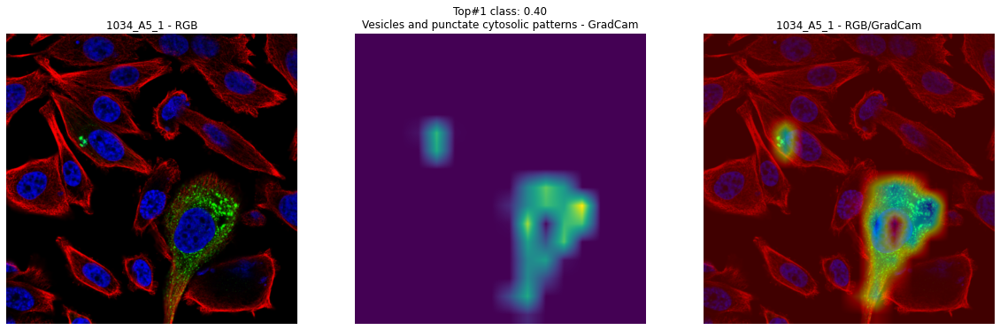


1038_G7_1 Top classes: [(0.9921875, 0)]


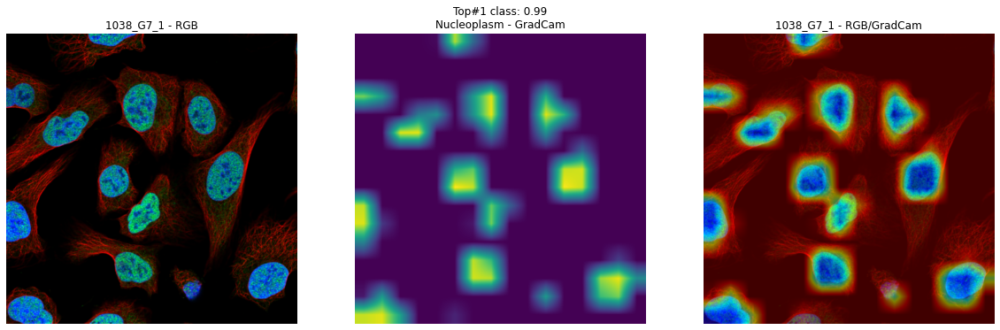


1326_C6_5 Top classes: [(0.9814453, 17), (0.96777344, 6), (0.1159668, 16)]


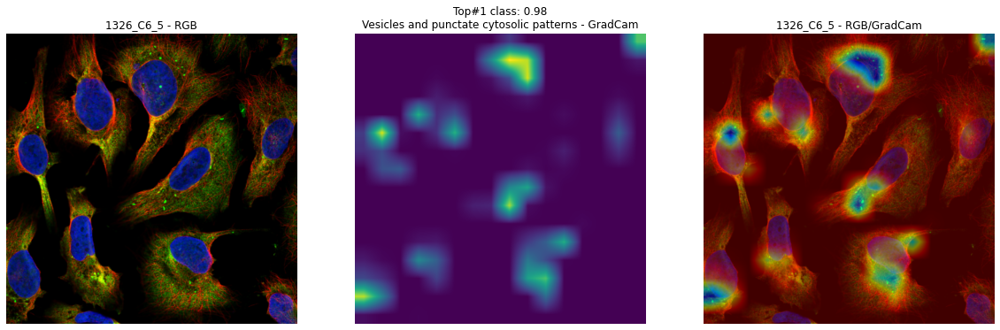

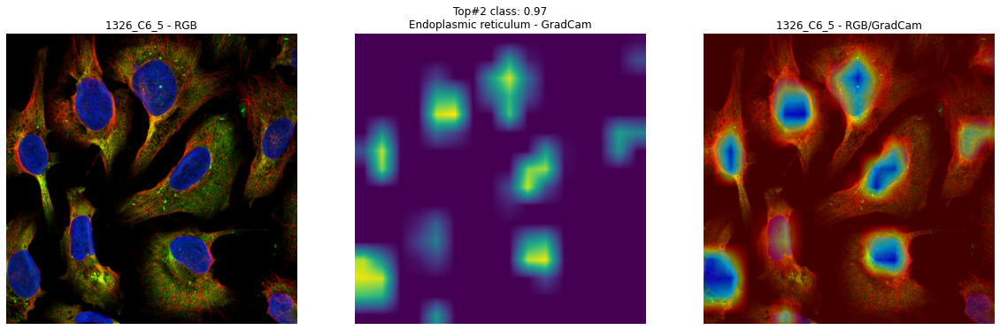

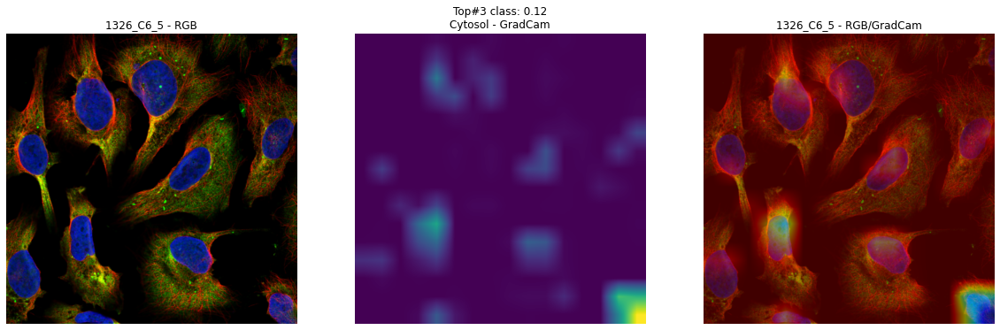


152_B7_1 Top classes: [(0.9902344, 14), (0.44189453, 16)]


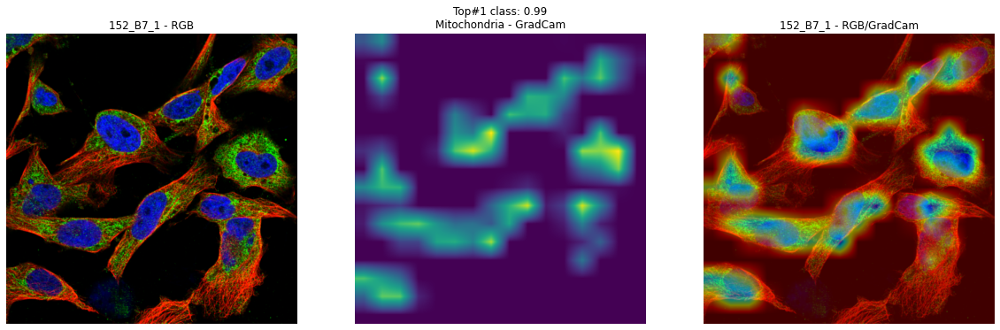

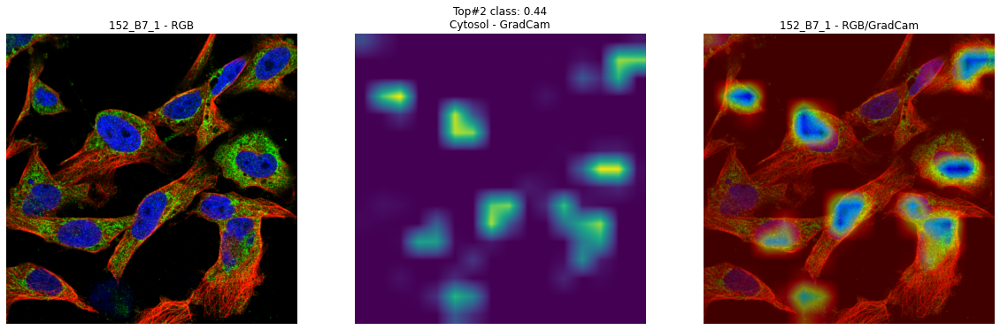


1537_F3_2 Top classes: [(0.50878906, 7)]


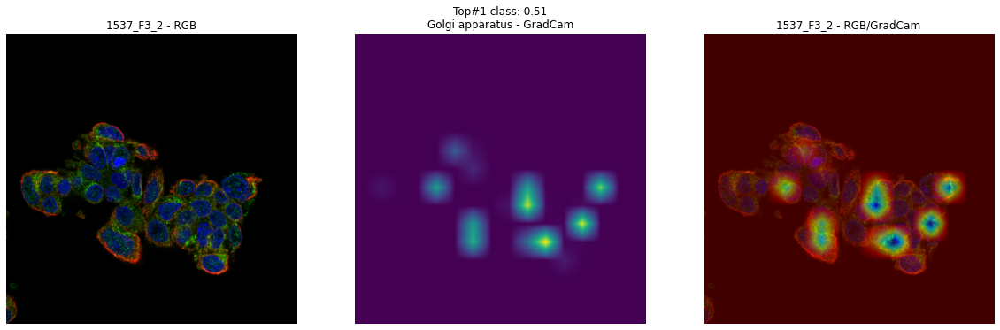


1657_E10_4 Top classes: [(1.0, 11), (0.9897461, 16)]


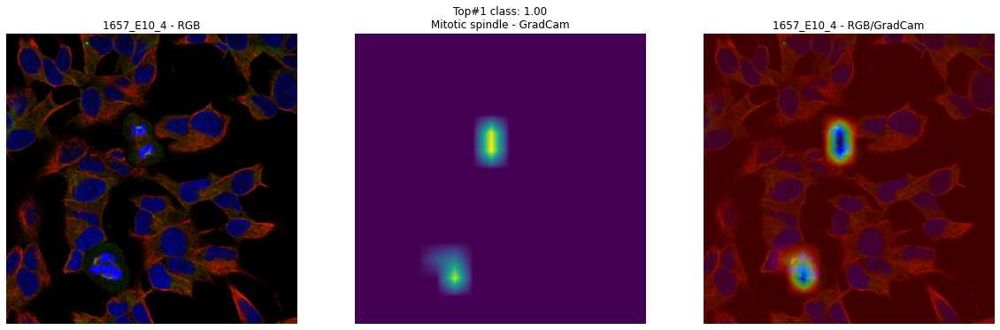

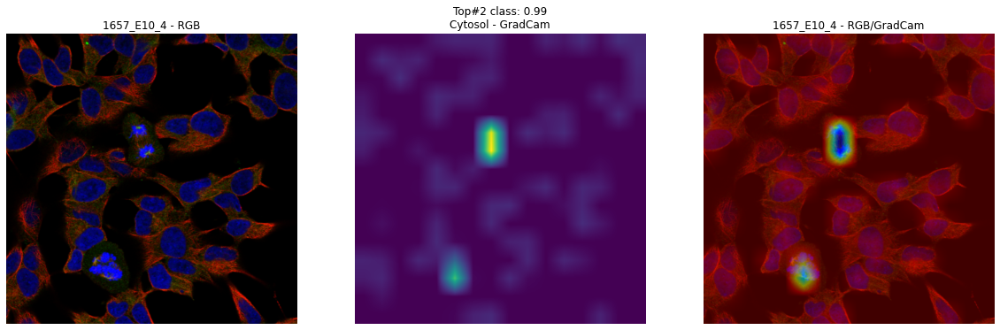


1717_G8_34 Top classes: [(1.0, 11), (0.99853516, 16)]


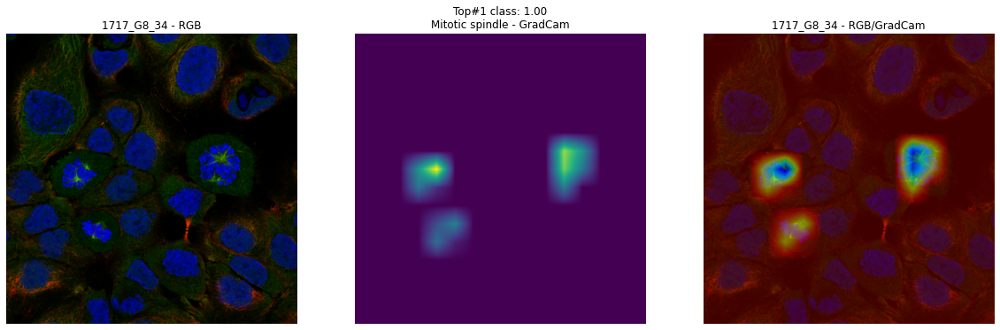

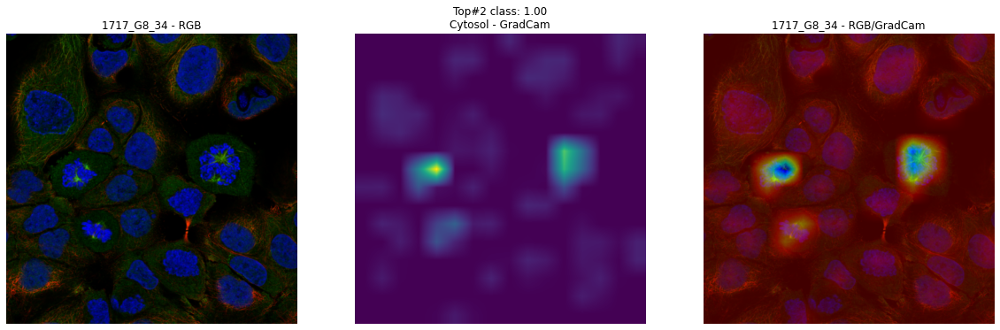


1878_C8_33 Top classes: [(0.94873047, 11)]


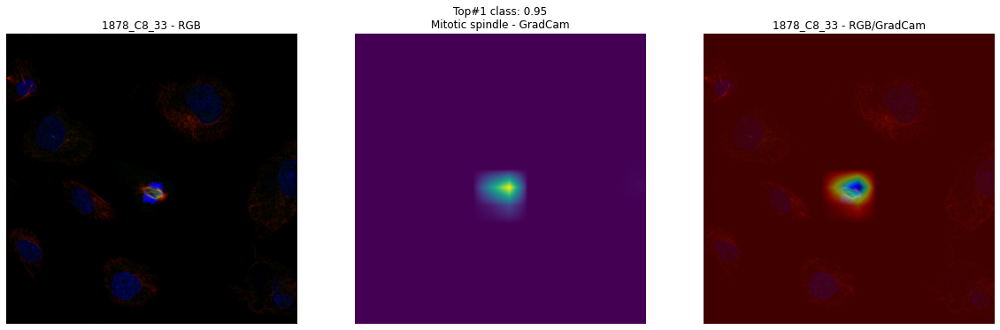


246_D12_1 Top classes: [(0.9838867, 14)]


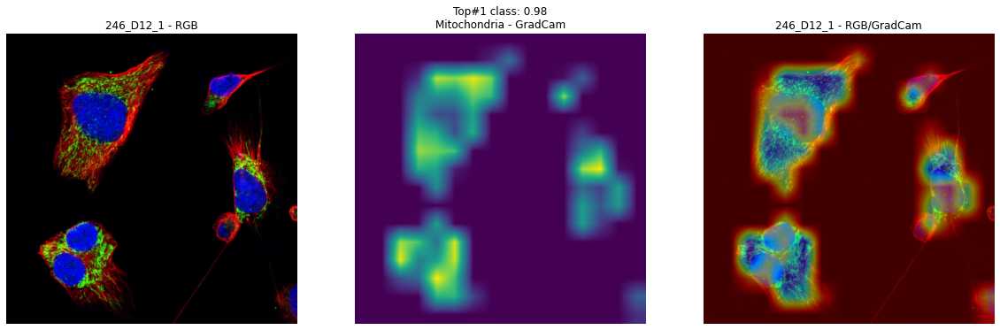


333_B6_1 Top classes: [(1.0, 6)]


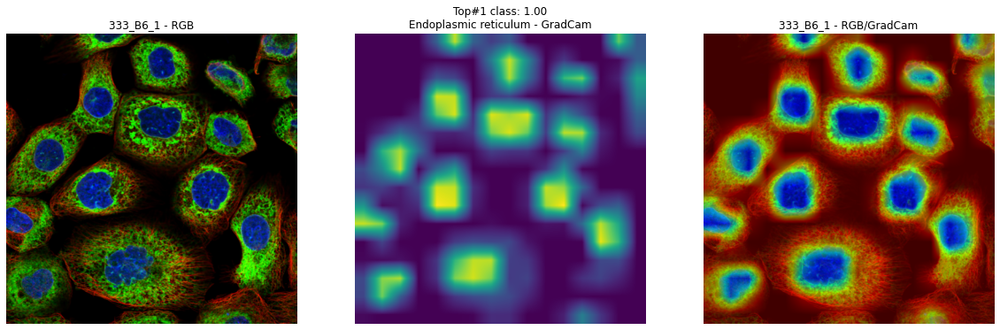


383_D2_2 Top classes: [(0.9970703, 2), (0.9951172, 16), (0.7314453, 5)]


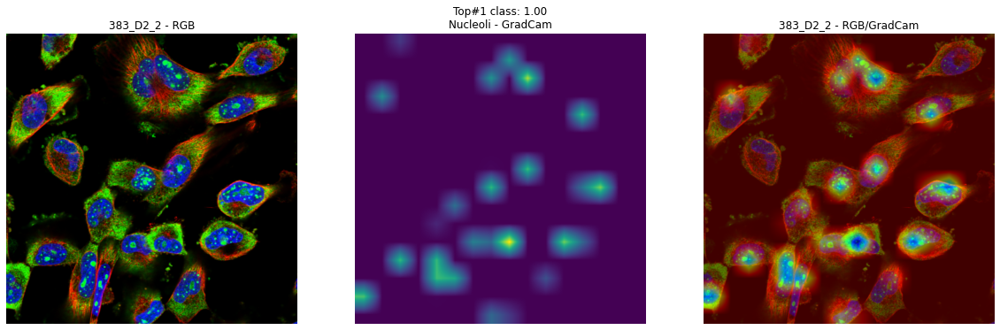

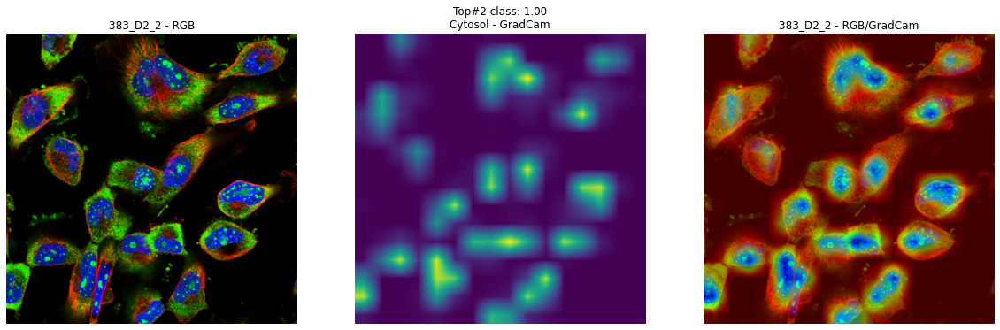

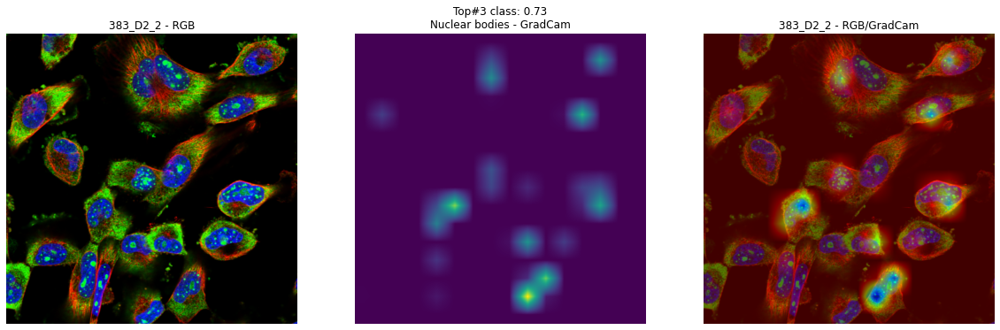


465_F10_1 Top classes: [(0.8310547, 16)]


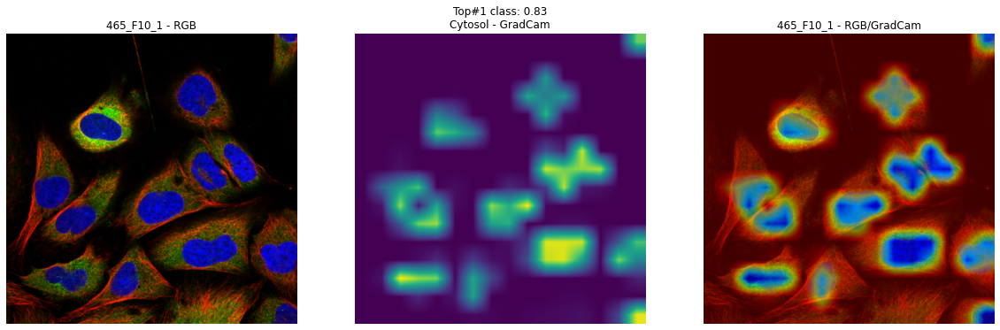


46_B11_2 Top classes: [(0.92529297, 17), (0.4663086, 16)]


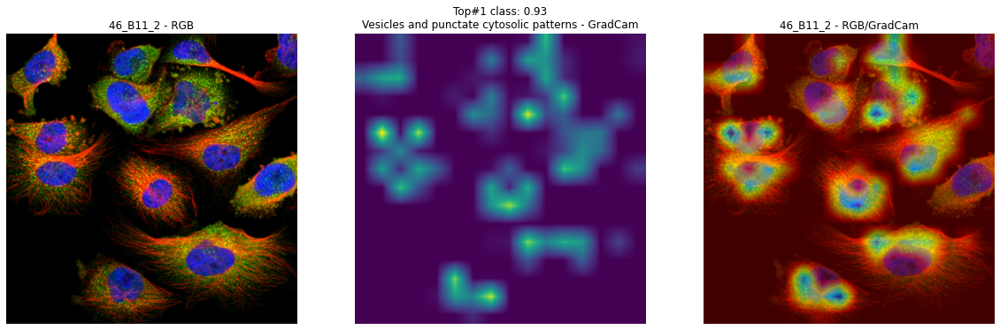

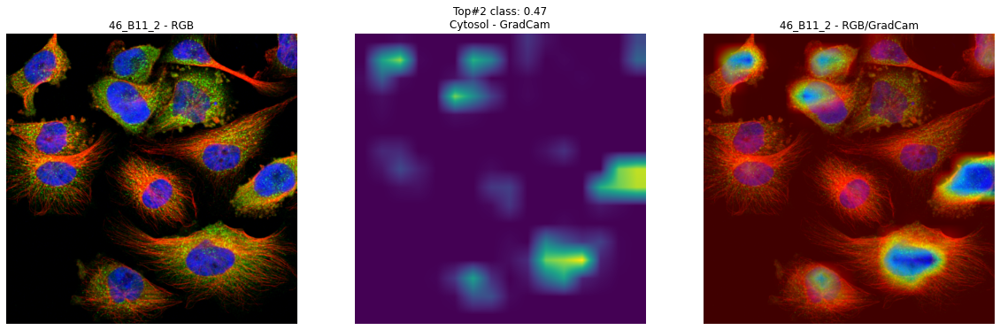


476_C7_1 Top classes: [(0.8574219, 17), (0.13549805, 13)]


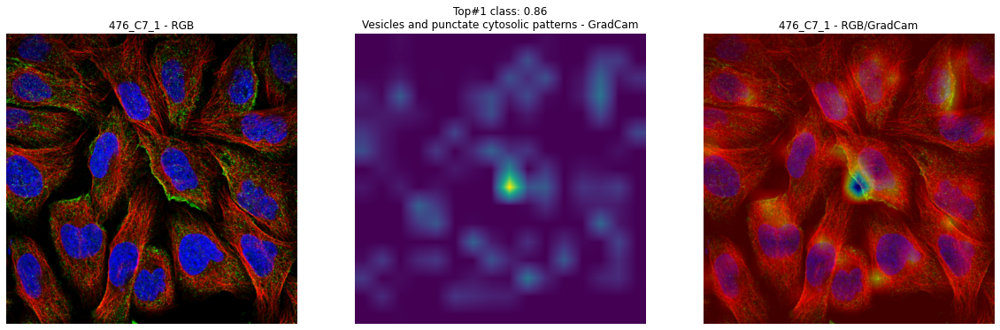

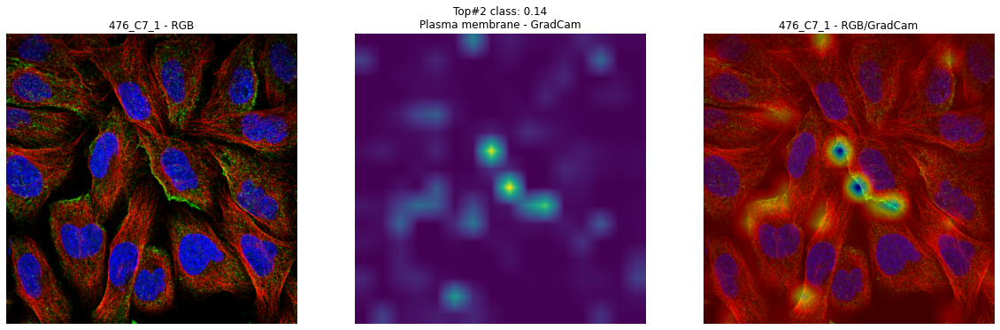


492_D3_2 Top classes: [(1.0, 14)]


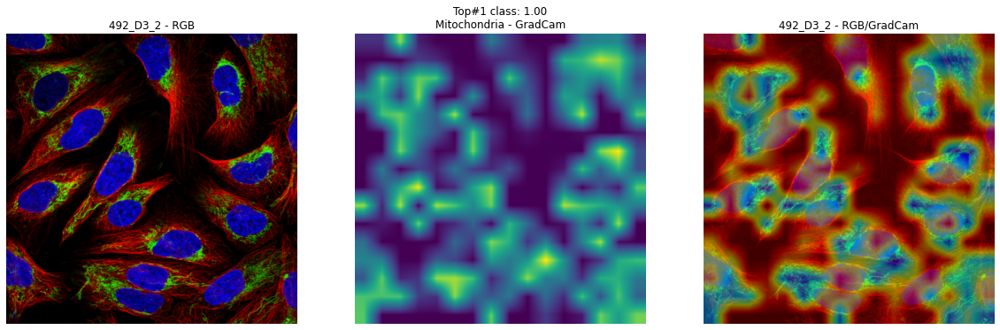


535_C3_1 Top classes: [(0.9038086, 0)]


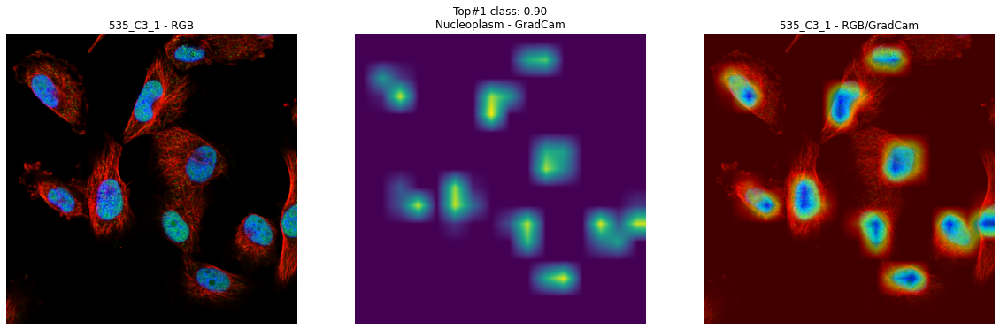


570_F10_1 Top classes: [(1.0, 17)]


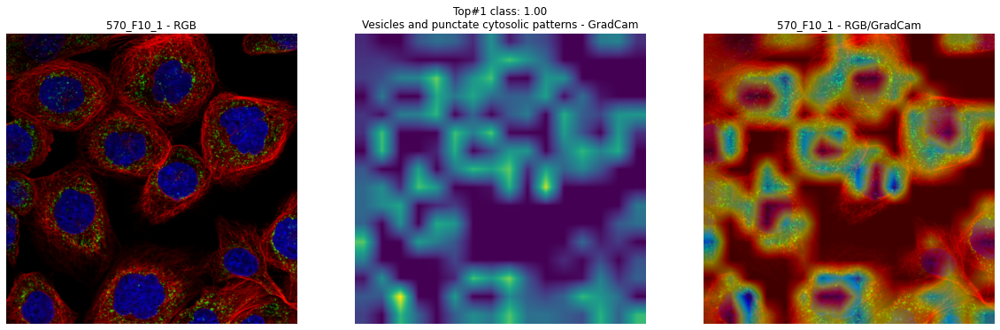


641_A4_4 Top classes: [(0.99609375, 12)]


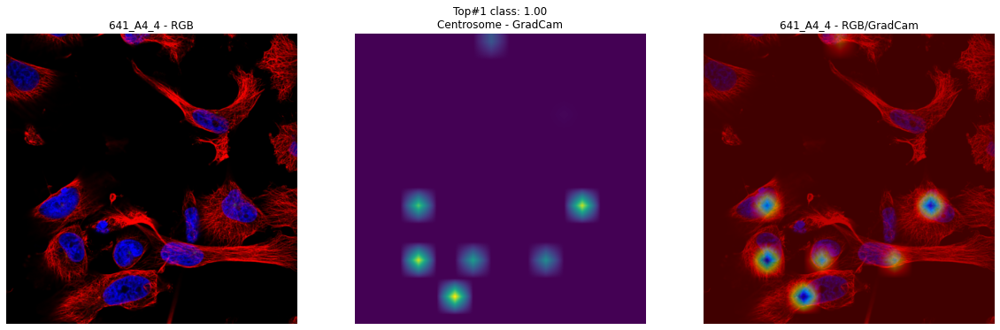


814_C5_1 Top classes: [(0.8623047, 14), (0.671875, 0)]


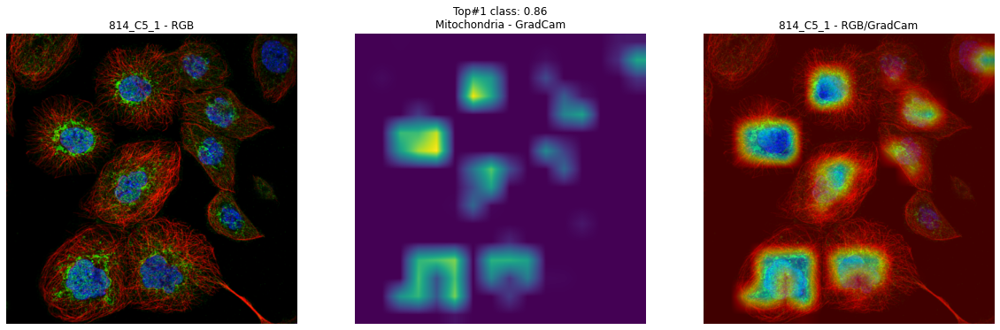

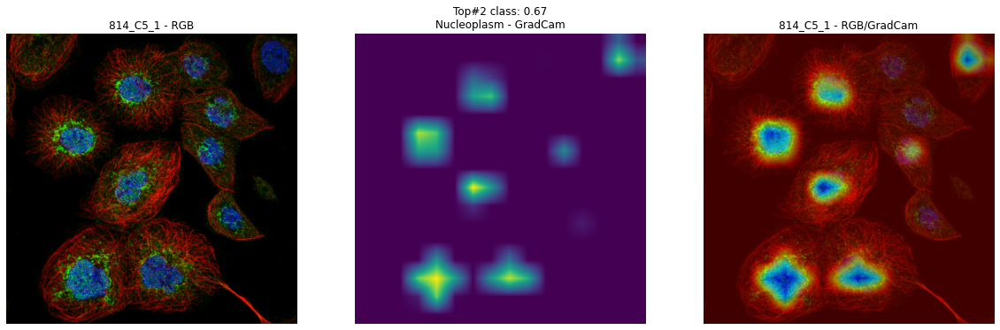


836_E7_2 Top classes: [(0.99072266, 6), (0.8989258, 16), (0.8613281, 13)]


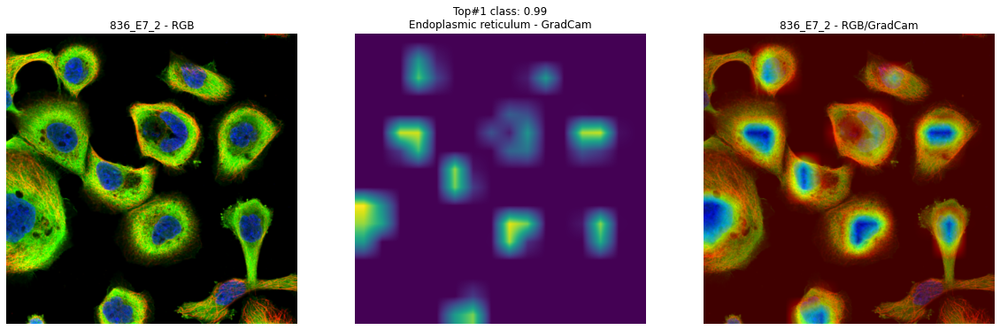

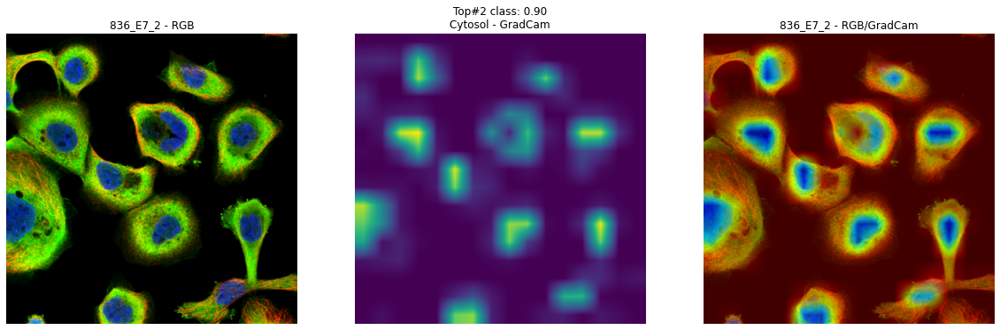

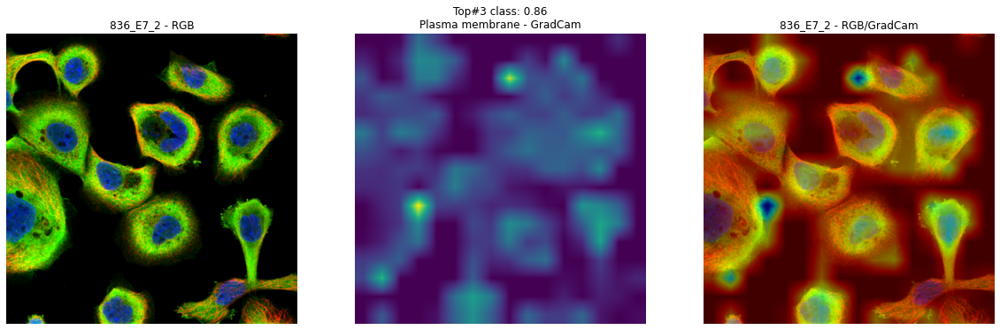

In [19]:
highest_pd = []
class_id = [i for i in range(18)]
for name in image_list:
    img = read_image(name, compose=conf.compose, normalize=conf.normalize, norm_value=conf.norm_value)
    img = skimage.transform.resize(img, (conf.image_size, conf.image_size), anti_aliasing=True) # Works with float32 image
    img = (conf.denormalize * img).astype(np.uint8)
    
    img_tensor = torch.from_numpy(np.expand_dims(prepare(image=img)['image'], axis=0))
    samples_data = img_tensor.to(conf.L_DEVICE)
    samples_data.shape    
    selected_class_preds, data = predict_full_image_mpware(model1, samples_data, normalizer_)    

    img_rgb = (img/255.0)[:, :, [0,1,2]]
    top3 = sorted(zip(selected_class_preds, class_id), reverse=True)[:3]
    top3 = [(k, v) for k, v in top3 if k > 0.10]
    print(name.replace("_red.png", ""), "Top classes:", top3)
    
    for t, (score, target_category) in enumerate(top3, 1):

        grayscale_cam = cam(input_tensor=data, target_category=target_category, aug_smooth=True)[0, :, :]
        visualization = show_cam_on_image(img_rgb, grayscale_cam)

        name_ = name.replace("_red.png", "")
        highest_pd.append((name_, target_category, selected_class_preds[target_category], class_mapping[target_category]))

        fig, ax = plt.subplots(1,3, figsize=(20, 8))
        d = ax[0].imshow(img_rgb)
        d = ax[0].grid(None)
        d = ax[0].axis('off')
        d = ax[0].set_title("%s - RGB" % name_)

        d = ax[1].imshow(grayscale_cam)
        d = ax[1].grid(None)
        d = ax[1].axis('off')
        d = ax[1].set_title("Top#%d class: %.2f\n%s - GradCam" % (t, selected_class_preds[target_category], class_mapping[target_category]))

        d = ax[2].imshow(visualization)
        d = ax[2].grid(None)
        d = ax[2].axis('off')
        d = ax[2].set_title("%s - RGB/GradCam" % name_)

        plt.savefig(name_ + ".png")
        d = plt.show()
    print()

In [20]:
highest_pd = pd.DataFrame(highest_pd, columns=["ID", "class", "class_prob", "class_name"])

In [21]:
highest_pd.groupby(["ID"]).agg(lambda x: list(x)).reset_index()

,ID,class,class_prob,class_name
0,1034_A5_1,[17],[0.404541015625],[Vesicles and punctate cytosolic patterns]
1,1038_G7_1,[0],[0.9921875],[Nucleoplasm]
2,1326_C6_5,"[17, 6, 16]","[0.9814453125, 0.9677734375, 0.115966796875]","[Vesicles and punctate cytosolic patterns, Endoplasmic reticulum, Cytosol]"
3,152_B7_1,"[14, 16]","[0.990234375, 0.44189453125]","[Mitochondria, Cytosol]"
4,1537_F3_2,[7],[0.5087890625],[Golgi apparatus]
5,1657_E10_4,"[11, 16]","[1.0, 0.98974609375]","[Mitotic spindle, Cytosol]"
6,1717_G8_34,"[11, 16]","[1.0, 0.99853515625]","[Mitotic spindle, Cytosol]"
7,1878_C8_33,[11],[0.94873046875],[Mitotic spindle]
8,246_D12_1,[14],[0.98388671875],[Mitochondria]
9,333_B6_1,[6],[1.0],[Endoplasmic reticulum]


In [22]:
highest_pd.to_csv("highest_classes.csv", index=False)